In [ ]:
with open('label_encoder.pkl', 'rb') as file:
    label_encoder = pickle.load(file)

In [153]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from wordcloud import WordCloud
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from gensim.models import Word2Vec
import pickle
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.preprocessing import LabelEncoder

# Download NLTK resources (only needs to be done once)
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [154]:
dataset = pd.read_csv('Resume Dataset.csv', encoding='utf-8')
dataset.head()

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


In [227]:
dataset['Category'].value_counts()

,count
Category,
Java Developer,84
Testing,70
DevOps Engineer,55
Python Developer,48
Web Designing,45
HR,44
Hadoop,42
Blockchain,40
ETL Developer,40


In [155]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 962 entries, 0 to 961
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  962 non-null    object
 1   Resume    962 non-null    object
dtypes: object(2)
memory usage: 15.2+ KB


In [156]:
# Initialize lemmatizer
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words("english"))

In [168]:
# Text cleaning function with sentence tokenization and lemmatization
def clean_and_process_text(text):
    # Step 1: Remove non-alphanumeric characters (except spaces)
    text = re.sub(r"[^A-Za-z0-9+ ]", " ", text)
    # Step 2: Replace multiple spaces with a single space
    text = re.sub(r"\s{2,}", " ", text)
    # Step 3: Tokenize into sentences
    sentences = sent_tokenize(text)
    # Step 4: Process each sentence
    processed_sentences = []
    for sentence in sentences:
        # Tokenize words
        words = word_tokenize(sentence)
        # Remove stopwords and lemmatize
        words = [lemmatizer.lemmatize(word.lower()) for word in words if word.lower() not in stop_words]
        # Join the processed words back into a sentence
        processed_sentences.append(" ".join(words))
    # Step 5: Combine processed sentences back into a single string
    return " ".join(processed_sentences)

In [169]:
# Apply cleaning function to the Resume column
dataset['Cleaned_Resume'] = dataset['Resume'].apply(clean_and_process_text)

In [170]:
dataset.head()

,Category,Resume,Cleaned_Resume
0,Data Science,Skills * Programming Languages: Python (pandas...,skill programming language python panda numpy ...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...,education detail may 2013 may 2017 b e uit rgp...
2,Data Science,"Areas of Interest Deep Learning, Control Syste...",area interest deep learning control system des...
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,skill r python sap hana tableau sap hana sql s...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab...",education detail mca ymcaust faridabad haryana...


In [171]:
# Function to generate and display word clouds by category
def generate_word_clouds_by_category(data, resume_column, category_column):
    categories = data[category_column].unique()  # Get unique job categories

    for category in categories:
        # Filter resumes belonging to the current category
        resumes = data[data[category_column] == category][resume_column]

        # Combine all resumes into a single text for the word cloud
        text = " ".join(resumes)

        # Generate the word cloud
        wordcloud = WordCloud(width=800, height=400, background_color="white", colormap="viridis").generate(text)

        # Plot the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Word Cloud for {category}", fontsize=16)
        plt.show()

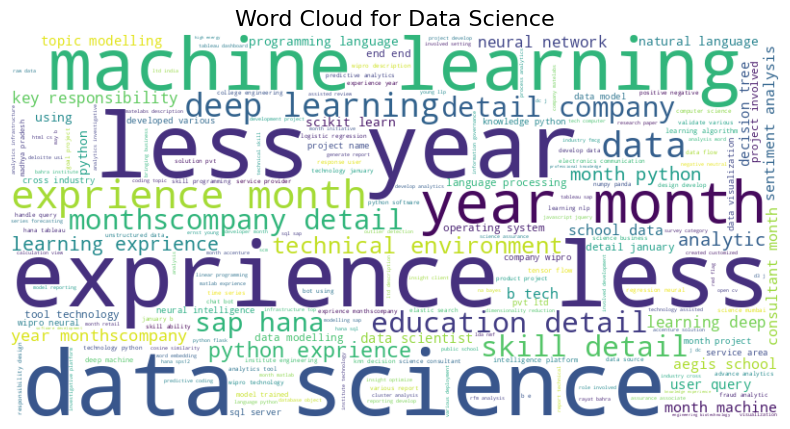

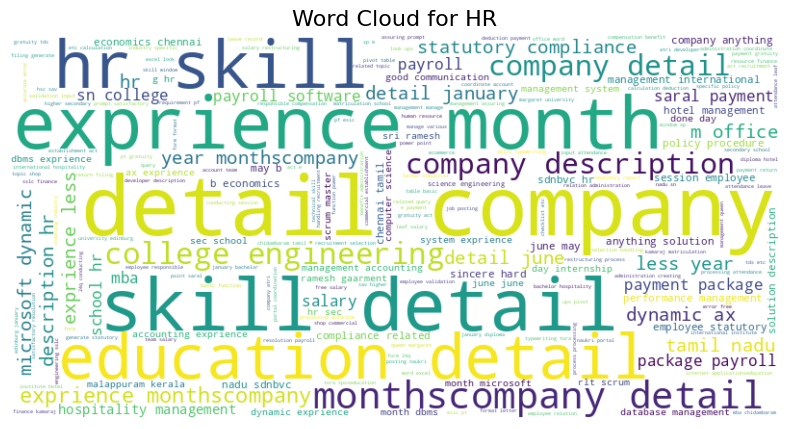

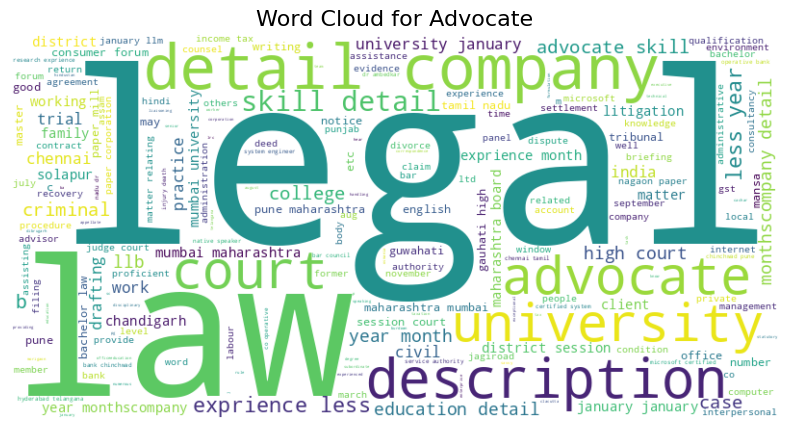

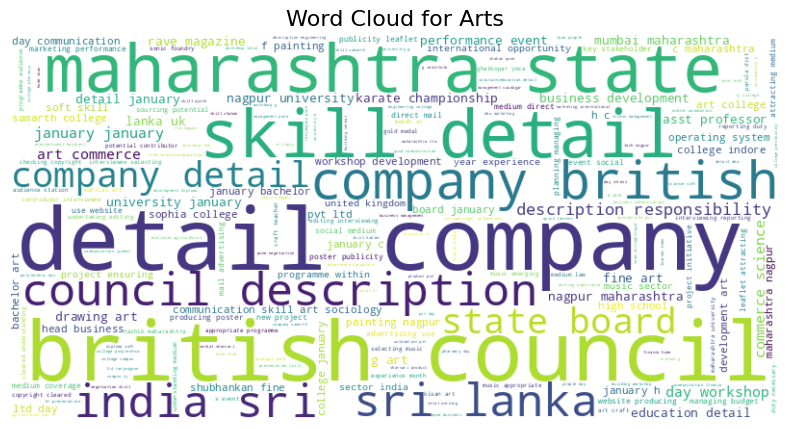

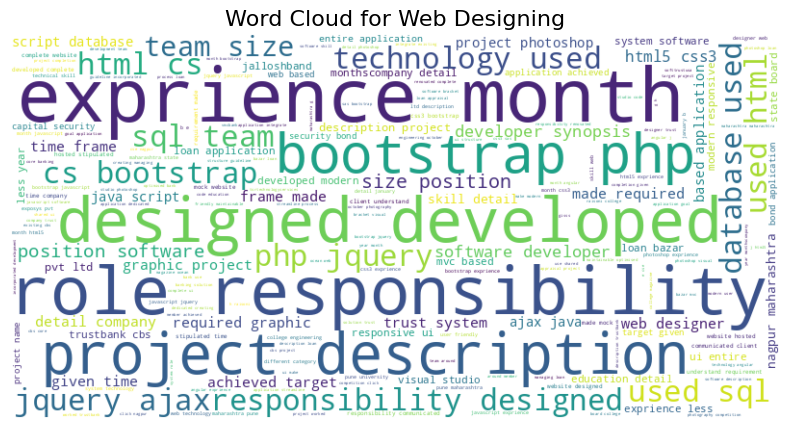

...

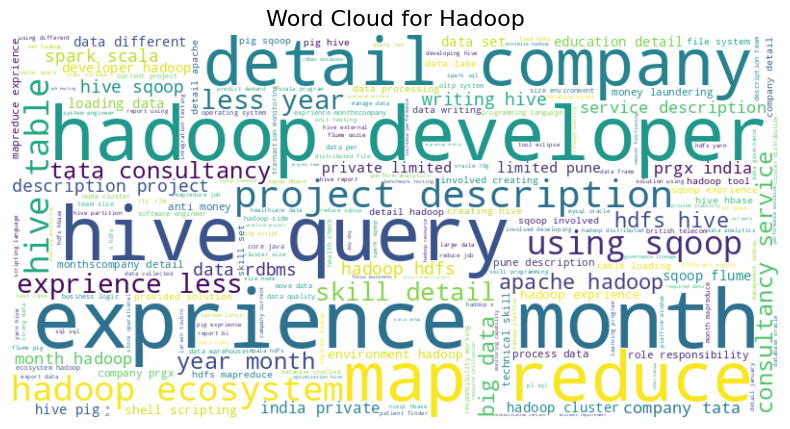

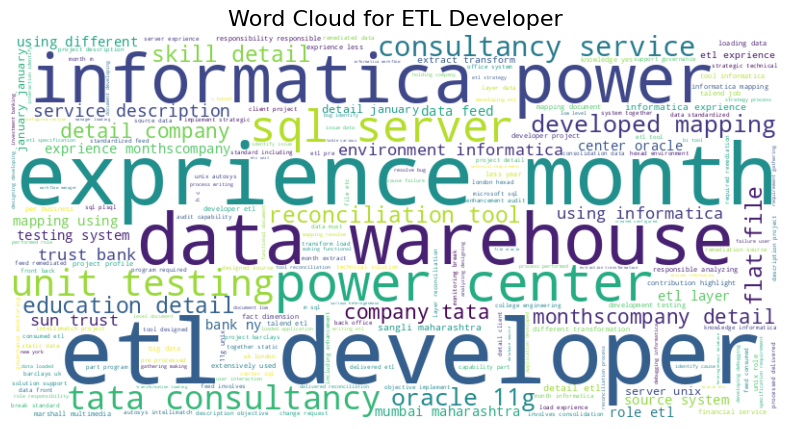

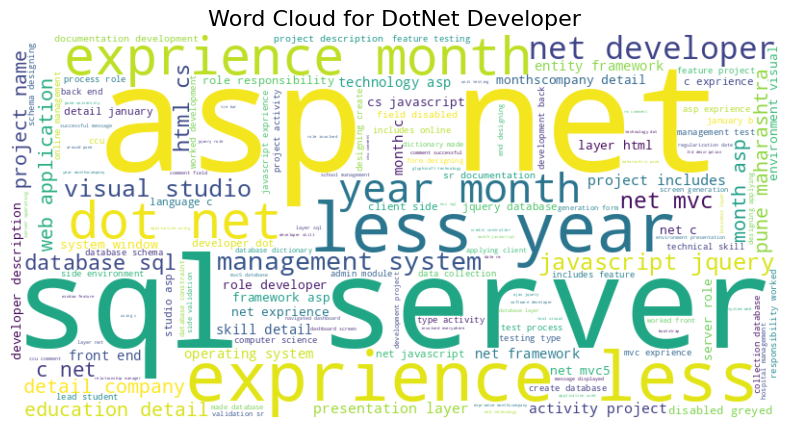

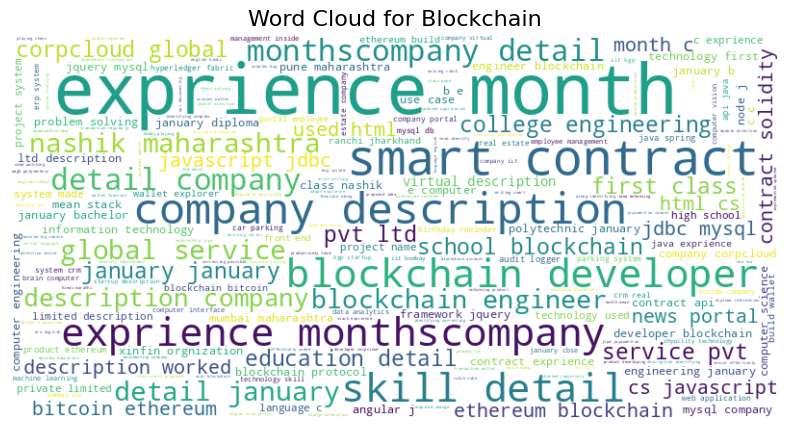

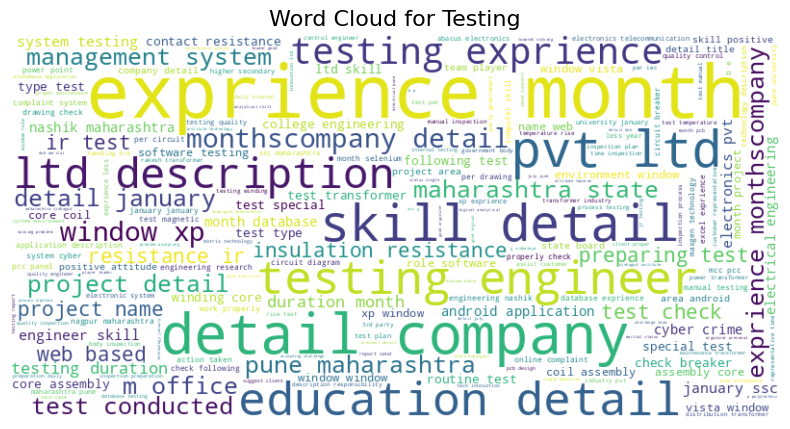

In [172]:
# Call the function to generate word clouds
generate_word_clouds_by_category(dataset, "Cleaned_Resume", "Category")

In [173]:
# Prepare data
cleaned_resumes = dataset['Cleaned_Resume'].astype(str).apply(lambda x: x.split())  # Tokenized resumes
categories = dataset['Category']

In [174]:
# Train-test split first
X_train, X_test, y_train, y_test = train_test_split(cleaned_resumes, categories, test_size=0.3, random_state=42)

In [175]:
X_train

,Cleaned_Resume
228,"[skill, m, office, photoshop, sql, server, edu..."
327,"[operating, system, window, xp, 7, 10, tool, p..."
955,"[good, logical, analytical, skill, positive, a..."
212,"[education, detail, january, 2018, bachelor, e..."
79,"[education, detail, mba, acn, college, enginee..."
...,...
106,"[additional, qualification, april, 2000, web, ..."
270,"[education, detail, may, 2014, diploma, nutrit..."
860,"[software, skill, language, c, c++, java, oper..."
435,"[education, detail, january, 2016, bachelor, e..."


In [176]:
y_train

,Category
228,Sales
327,Java Developer
955,Testing
212,Mechanical Engineer
79,HR
...,...
106,Arts
270,Health and fitness
860,Blockchain
435,SAP Developer


In [177]:
len(X_train), len(y_train)

(673, 673)

In [178]:
# Word2Vec model training
def train_word2vec_model(tokenized_texts, vector_size=100, window=5, min_count=2):
    model = Word2Vec(sentences=tokenized_texts, vector_size=vector_size, window=window, min_count=min_count, workers=4)
    return model

In [179]:
# Train Word2Vec model using the training data
word2vec_model = train_word2vec_model(X_train)

In [180]:
with open('word2vec_model.pkl', 'wb') as file:
    pickle.dump(word2vec_model, file)

In [187]:
# Convert the text data into a single numerical representation using Average Word2Vec
def avg_word2vec(word2vec_model, text):
    # If text is a list of words, join them into a single string
    if isinstance(text, list):
        text = ' '.join(text)

    # Tokenize the entire text
    tokens = word_tokenize(text)  # Tokenizing the entire resume text
    word_vectors = [word2vec_model.wv[word.lower()] for word in tokens if word.lower() in word2vec_model.wv]

    # If there are any word vectors, compute the mean
    if word_vectors:
        vector = np.mean(word_vectors, axis=0)  # Mean of word vectors
    else:
        vector = np.zeros(word2vec_model.vector_size)  # Zero vector if no words match

    return vector

In [188]:
# Vectorize both train and test data
X_train_vec = X_train.apply(lambda x: avg_word2vec(word2vec_model, x))  # Apply the function correctly

In [189]:
X_train_vec

,Cleaned_Resume
228,"[-0.55761975, 0.2437907, 0.18108924, 0.1574867..."
327,"[-0.8162764, 0.76731604, 0.54313475, 0.1483249..."
955,"[-0.54809934, 0.23570965, 0.41630396, 0.197453..."
212,"[-0.5172231, -0.07462632, 0.4587054, 0.1409846..."
79,"[-0.9898265, 0.12688422, 0.45955935, 0.1897389..."
...,...
106,"[-0.2847456, 0.07092606, 0.040685285, 0.094703..."
270,"[-0.2966828, 0.053106852, 0.062014848, 0.05119..."
860,"[-0.6065541, 0.5476243, 0.35253495, 0.11442391..."
435,"[-0.34440067, 0.304448, 0.1606865, 0.10342702,..."


In [190]:
# Encode target categories
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)  # Encoding train labels

In [191]:
y_train_encoded

array([22, 15, 23, 16, 12, 24, 17, 20,  5,  8,  5,  1, 18, 20, 11,  6, 17,
       18,  5, 23, 21,  8, 24,  1, 15, 13,  3,  0, 23, 24, 14,  3, 12, 14,
        1,  5, 15, 24, 10,  1, 24,  6, 18, 16, 17,  7, 24, 11, 24, 24,  6,
        8, 19, 12, 17, 19, 22, 24, 13, 22, 16,  9,  2,  1, 23, 15, 16, 12,
       20,  1, 11, 12,  2, 17, 18,  6,  4, 23,  9,  3, 15, 12, 23,  3, 10,
       22, 18, 23,  2,  4,  6, 19, 18,  8, 15, 12, 12, 23, 14, 14, 15, 15,
       17, 14,  6, 24, 15, 21, 20, 16, 18, 19,  8,  7, 20, 20, 24,  7,  8,
        3, 11, 23, 24, 22, 19,  9, 15,  4, 12,  1, 18, 18, 15,  1,  1,  4,
        4,  4,  0, 13,  0, 15, 23,  3, 23, 20, 10, 10,  0,  6, 15, 11, 12,
       12, 15, 24, 21,  9, 13, 10,  0,  4, 24, 21,  4,  8,  9, 13, 24, 15,
        8, 13, 17, 15, 22, 18, 15, 20,  6,  6,  8, 22, 18,  9, 19, 11, 15,
       16, 24, 14, 20, 15, 23,  6, 22,  6, 15, 16, 17,  9, 23, 23, 15, 21,
       18, 10, 20, 16,  8, 21, 22,  0, 20, 18, 12, 20, 10, 14, 24, 23, 13,
       21, 17, 24, 12,  3

In [192]:
with open('label_encoder.pkl', 'wb') as file:
    pickle.dump(label_encoder, file)

In [196]:
# Convert the list of vectors into a 2D numpy array
X_train_vec_flattened = np.vstack(X_train_vec.values)

In [197]:
X_train_vec_flattened

array([[-0.55761975,  0.2437907 ,  0.18108924, ..., -0.48276958,
         0.08522445, -0.22890238],
       [-0.8162764 ,  0.76731604,  0.54313475, ..., -0.7343003 ,
        -0.00147121, -0.29369032],
       [-0.54809934,  0.23570965,  0.41630396, ..., -0.51548696,
        -0.18180461, -0.6819408 ],
       ...,
       [-0.6065541 ,  0.5476243 ,  0.35253495, ..., -0.49918163,
         0.1172234 , -0.17217419],
       [-0.34440067,  0.304448  ,  0.1606865 , ..., -0.42061403,
         0.05986932, -0.32145247],
       [-0.5438265 ,  0.22559947,  0.22001924, ..., -0.5181695 ,
        -0.03233249, -0.40816796]], dtype=float32)

In [198]:
# Now train the RandomForest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_vec_flattened, y_train_encoded)

RandomForestClassifier(random_state=42)

In [199]:
X_test_vec = X_test.apply(lambda x: avg_word2vec(word2vec_model, x))  # Apply the function correctly

In [200]:
y_test_encoded = label_encoder.transform(y_test)  # Encoding test labels

In [201]:
# Convert the list of vectors into a 2D numpy array
X_test_vec_flattened = np.vstack(X_test_vec.values)

In [202]:
# Make predictions on the test set
y_pred_encoded = rf_model.predict(X_test_vec_flattened)  # Predict encoded labels

In [203]:
y_pred_encoded

array([15, 15, 15, 13, 14, 17, 16,  2, 12, 14, 13, 12, 16, 23, 20,  5,  6,
        4, 10,  9, 19,  1, 10, 23, 23,  6, 22, 22,  2, 12, 18,  1,  8, 24,
       11, 23,  7, 12, 24,  8, 18,  6,  8, 19, 24, 23, 21,  1, 15,  4, 15,
       22, 11,  5, 15, 13,  1, 19,  5, 12, 22, 22, 20, 24, 21, 18, 12, 10,
       10, 20, 10,  8,  9, 21, 17, 21,  0, 17, 16, 14, 15, 11, 11,  8, 20,
        3, 19,  8, 12,  2,  9, 10,  2, 23, 20, 20, 23, 12, 18, 12,  7, 16,
        8, 14, 18,  3, 14, 19, 14, 14, 15, 18,  8,  2, 21, 18, 23, 10, 23,
        5, 11, 15, 12,  3,  5,  3,  7, 12, 19,  8, 20,  4,  3, 15,  9, 19,
        1, 23, 21,  5, 20, 15, 16,  7,  7,  8, 15, 18,  1, 15, 13, 20,  7,
        4, 18, 11,  5, 15,  5, 12,  9, 22, 18, 21,  8, 23,  4, 12, 24, 16,
       15, 22,  8, 22,  3, 16, 23, 23, 12,  7, 16, 18,  5,  3, 18,  8, 23,
       23, 20,  6,  6,  7, 23,  2,  3, 18, 14,  1, 12, 13, 22, 12, 11, 23,
       18, 15, 19, 15,  6,  0, 15,  8,  9, 16,  6, 12, 14,  9, 15,  4,  0,
       20, 16,  7,  8, 23

In [204]:
# Convert predictions back to original categories
y_pred = label_encoder.inverse_transform(y_pred_encoded)  # Convert encoded predictions to original categories

In [205]:
y_pred

array(['Java Developer', 'Java Developer', 'Java Developer', 'Hadoop',
       'Health and fitness', 'Network Security Engineer',
       'Mechanical Engineer', 'Automation Testing', 'HR',
       'Health and fitness', 'Hadoop', 'HR', 'Mechanical Engineer',
       'Testing', 'Python Developer', 'Civil Engineer', 'Data Science',
       'Business Analyst', 'ETL Developer', 'DotNet Developer', 'PMO',
       'Arts', 'ETL Developer', 'Testing', 'Testing', 'Data Science',
       'Sales', 'Sales', 'Automation Testing', 'HR', 'Operations Manager',
       'Arts', 'DevOps Engineer', 'Web Designing',
       'Electrical Engineering', 'Testing', 'Database', 'HR',
       'Web Designing', 'DevOps Engineer', 'Operations Manager',
       'Data Science', 'DevOps Engineer', 'PMO', 'Web Designing',
       'Testing', 'SAP Developer', 'Arts', 'Java Developer',
       'Business Analyst', 'Java Developer', 'Sales',
       'Electrical Engineering', 'Civil Engineer', 'Java Developer',
       'Hadoop', 'Arts', 'PMO

In [206]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)  # Compare original test labels with predicted ones
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

In [207]:
# Print evaluation metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Accuracy: 0.9862
Precision: 0.9881
Recall: 0.9862
F1 Score: 0.9858


In [208]:
with open('rf_model.pkl', 'wb') as file:
    pickle.dump(rf_model, file)

In [209]:
print(classification_report(y_test, y_pred))

                           precision    recall  f1-score   support

                 Advocate       1.00      0.67      0.80         6
                     Arts       1.00      1.00      1.00         8
       Automation Testing       1.00      1.00      1.00         7
               Blockchain       1.00      1.00      1.00        11
         Business Analyst       0.82      1.00      0.90         9
           Civil Engineer       1.00      1.00      1.00        11
             Data Science       1.00      1.00      1.00        11
                 Database       1.00      1.00      1.00         9
          DevOps Engineer       1.00      0.89      0.94        19
         DotNet Developer       1.00      1.00      1.00        11
            ETL Developer       1.00      1.00      1.00         9
   Electrical Engineering       1.00      1.00      1.00         9
                       HR       0.89      1.00      0.94        17
                   Hadoop       1.00      1.00      1.00     

In [216]:
resume = """ Kolla Yasaswini Sravani Mona
yasaswinikolla78@gmail.com | +91 7989956919
https://www.linkedin.com/in/yasaswinis23/ | https://github.com/yasaswinis23/
EXPERIENCE
Web Development Intern: InternPe Pvt. Ltd. Aug 2023 – Sep 2023
 Pioneered a language translator development with 40% improved accuracy and 30% faster processing time
 Crafted a responsive text editor with a 25% increase in user interface responsiveness, integrated with a
language translator for a 15% faster loading time and 25% reduction in overall page size
Python Full Stack Intern: Codegnan IT Solutions May 2023 – Jul 2023
 Directed a 4-member team to develop a Python-based Hospital Management Web App, achieving 98% data
tracking accuracy and elevating user engagement by 25% through interactive data visualization
 Enhanced Python, MySQL, HTML, CSS, and AWS skills through expert collaboration, resulting in a 30% boost
in user engagement and goal adherence, with a backend resulting 98% accuracy in data tracking
EDUCATION
St. Ann’s College of Engineering and Technology, Chirala Aug 2020 – May 2024
Bachelor of Technology (B. Tech), Computer Science and Engineering (CSE), GPA: 7.91
SKILLS
 Programming Languages: Python, HTML, CSS, JavaScript
 Databases and Frameworks: MySQL, SQL, Flask
 Version Control Tools and IDE: Visual Studio Code, Google Colaboratory, Git and GitHub
 Course Work: Database Management System (DBMS), Object-Oriented Programming Language (OOPS),
Operating Systems (Windows & Linux), Data Structures and Algorithms, Encryption Techniques
PROJECTS
Cloud-Based Data Lake | Python, Flask, HTML, CSS, Amazon EC2, S3, Athena, AWS Glue Apr 2024
 Engineered highly efficient data ingestion processes with AWS Glue and Amazon S3, halving data ingestion
time by an impressive 50%, facilitating rapid analysis and insights extraction
 Orchestrated real-time analytics with AWS Lambda and Amazon Athena, achieving a 75% decrease in query
response time, empowering swift, informed decisions based on up-to-date data insights
Swift and Efficient Hospital Management System | Python, Flask, MySQL, HTML, CSS Jul 2023
 Developed a streamlined web application that simplifies appointment scheduling and registration for users,
increasing appointment bookings by 40%
 Designed and deployed an intuitive interface tailored for hospital staff, enhancing efficiency in patient
management and report access, leading to a notable 30% reduction in administrative workload
 Implemented interactive data visualization features, sparking a remarkable 30% increase in user
engagement
 Revamped load times and responsiveness, slashing page load speed by 25% and ensuring cross-device
compatibility, resulting in enhanced user satisfaction and usability
RESEARCH PAPER
 Authored and published a groundbreaking Research Paper titled "Fire and Smoke Detection using CNN"
at ICRTCSE-2023, showcasing a novel approach that achieved a 95% accuracy rate
POSITION OF RESPONSIBILITY
Technical Club Associate: St. Ann’s College of Engineering and Technology
 Coordinated and executed a diverse array of quizzes and competitions, engaging a participant base
exceeding 250 students, centered around challenging technical concepts
CERTIFICATIONS
 Front End Development from Edunet Foundation, IBM
 Joy of Computing using Python by NPTEL & Python for Data Science from NPTEL
 Tinder Clone using HTML, CSS from DevTown, Google DSC and Microsoft Learn Student Ambassador
"""

In [217]:
resume_text = clean_and_process_text(resume)

In [218]:
resume_text

'kolla yasaswini sravani mona yasaswinikolla78 gmail com +91 7989956919 http www linkedin com yasaswinis23 http github com yasaswinis23 experience web development intern internpe pvt ltd aug 2023 sep 2023 pioneered language translator development 40 improved accuracy 30 faster processing time crafted responsive text editor 25 increase user interface responsiveness integrated language translator 15 faster loading time 25 reduction overall page size python full stack intern codegnan solution may 2023 jul 2023 directed 4 member team develop python based hospital management web app achieving 98 data tracking accuracy elevating user engagement 25 interactive data visualization enhanced python mysql html cs aws skill expert collaboration resulting 30 boost user engagement goal adherence backend resulting 98 accuracy data tracking education st ann college engineering technology chirala aug 2020 may 2024 bachelor technology b tech computer science engineering cse gpa 7 91 skill programming lan

In [219]:
resume_text = resume_text.split()

In [220]:
resume_text

['kolla',
 'yasaswini',
 'sravani',
 'mona',
 'yasaswinikolla78',
 'gmail',
 'com',
 '+91',
 '7989956919',
 'http',
 'www',
 'linkedin',
 'com',
 'yasaswinis23',
 'http',
 'github',
 'com',
 'yasaswinis23',
 'experience',
 'web',
 'development',
 'intern',
 'internpe',
 'pvt',
 'ltd',
 'aug',
 '2023',
 'sep',
 '2023',
 'pioneered',
 'language',
 'translator',
 'development',
 '40',
 'improved',
 'accuracy',
 '30',
 'faster',
 'processing',
 'time',
 'crafted',
 'responsive',
 'text',
 'editor',
 '25',
 'increase',
 'user',
 'interface',
 'responsiveness',
 'integrated',
 'language',
 'translator',
 '15',
 'faster',
 'loading',
 'time',
 '25',
 'reduction',
 'overall',
 'page',
 'size',
 'python',
 'full',
 'stack',
 'intern',
 'codegnan',
 'solution',
 'may',
 '2023',
 'jul',
 '2023',
 'directed',
 '4',
 'member',
 'team',
 'develop',
 'python',
 'based',
 'hospital',
 'management',
 'web',
 'app',
 'achieving',
 '98',
 'data',
 'tracking',
 'accuracy',
 'elevating',
 'user',
 'engagem

In [103]:
len(resume_text)

388

In [108]:
# Convert the text data into a single numerical representation using Average Word2Vec
def avg_word2vec2(word2vec_model, text):
    # Tokenize the entire text
    tokens = word_tokenize(text.lower())  # Tokenizing the entire resume text
    word_vectors = [word2vec_model.wv[word] for word in tokens if word in word2vec_model.wv]

    # If there are any word vectors, compute the mean
    if word_vectors:
        vector = np.mean(word_vectors, axis=0)  # Mean of word vectors
    else:
        vector = np.zeros(word2vec_model.vector_size)  # Zero vector if no words match

    return vector

In [221]:
vector = avg_word2vec(word2vec_model, resume_text)

In [222]:
vector

array([-0.26894635,  0.4153652 ,  0.23207757,  0.01785483,  0.03588805,
       -0.65439165, -0.03266146,  0.83153284, -0.38743097, -0.1581478 ,
       -0.15551779, -0.42852667,  0.00531182,  0.09627385,  0.14573191,
       -0.25853172,  0.02989088, -0.29455942,  0.07896218, -0.69858915,
        0.4095587 , -0.01143742,  0.24046972, -0.12630042, -0.14807555,
       -0.0850071 , -0.43099108, -0.14267801, -0.24948293,  0.2116259 ,
        0.35384727,  0.16284116,  0.2425912 , -0.18638165,  0.08885643,
        0.6502957 ,  0.11078194, -0.24016668, -0.2416212 , -0.7146913 ,
        0.118499  , -0.41440204,  0.01924158,  0.06339778,  0.2362469 ,
       -0.13970399, -0.33754462, -0.07128991,  0.12492809,  0.09094529,
        0.11774335, -0.21751626, -0.16324945, -0.09572267, -0.10958558,
        0.2612787 ,  0.262596  ,  0.2730249 , -0.41516858,  0.24818827,
        0.08508627,  0.10754309, -0.24379593, -0.11030385, -0.3493045 ,
        0.08630589,  0.35681584,  0.30821586, -0.3493858 ,  0.53

In [225]:
# Ensure the vector is a 2D array with 1 row and 100 features (this is what the model expects)
cat = rf_model.predict(vector.reshape(1, -1))  # This reshapes it to (1, 100), matching the trained input shape
print(cat)

[6]


In [226]:
label_encoder.inverse_transform(cat)

array(['Data Science'], dtype=object)